In [0]:
%run "/Workspace/Users/laura.dixon@nationalhighways.co.uk/Test1/Feature Engineering"

ID,DoB,Sex,Employment_Status,Employment_Income,Education_Level,Household_Income,Marital_Status,Number_of_Children,Postcode,Passport_Number,Industry
1,2006-11-30,Male,Student,0.0,GCSE,950410,Divorced,3,EF2 7XM,C32875746,Finance
2,1955-05-01,Female,Unemployed,0.0,Undergraduate Degree,575388,Single,1,CD3 8UX,B72473742,Education
3,1927-12-19,Female,Employed,0.0,GCSE,12099,Divorced,1,FG3 3KA,M51952138,Transport
4,1972-09-22,Female,Student,50912.85272433476,PostGraduate Degree,14344,Cohabiting,0,FG1 6HB,Y67063629,Transport
5,1990-02-19,Male,Employed,0.0,PostGraduate Degree,412347,Cohabiting,1,FG6 4RF,K69186899,Retail
6,1969-03-17,Male,Student,6375.982275828855,Undergraduate Degree,5413,Divorced,3,CD1 5WJ,M57089477,Agriculture
7,1962-10-10,Female,Student,0.0,No Formal Education,3719,Divorced,0,AB4 5WT,G25493261,Construction
8,1985-11-12,Female,Unemployed,0.0,Doctorate,22190,Single,4,FG2 9MD,F31995067,Transport
9,1991-10-02,Female,Self-Employed,41848.025427865345,A-Level,94966,Widowed,3,DE3 8UG,H08289175,Education
10,1983-01-28,Male,Self-Employed,16276.78170088938,Doctorate,41,Divorced,1,CD1 1AW,Q01739113,Education


Databricks data profile. Run in Databricks to view.

['ID',
 'Sex',
 'Employment_Status',
 'Employment_Income',
 'Education_Level',
 'Household_Income',
 'Marital_Status',
 'Number_of_Children',
 'Industry',
 'Is_Valid_DoB',
 'Age',
 'Valid_Passport',
 'Country_of_issue',
 'County',
 'Valid_Children',
 'Valid_MaritalStatus']

19327.030668

ID,Sex,Employment_Status,Employment_Income,Education_Level,Household_Income,Marital_Status,Number_of_Children,Industry,Is_Valid_DoB,Age,Valid_Passport,Country_of_issue,County,Valid_Children,Valid_MaritalStatus,Successful_at_Work
1,Male,Student,0.0,GCSE,950410,Divorced,3,Finance,Valid,17,Yes,C,EF,Valid,Valid,false
2,Female,Unemployed,0.0,Undergraduate Degree,575388,Single,1,Education,Valid,69,Yes,B,CD,Valid,Valid,false
3,Female,Employed,0.0,GCSE,12099,Divorced,1,Transport,Valid,96,Yes,M,FG,Valid,Valid,false
4,Female,Student,50913.0,PostGraduate Degree,14344,Cohabiting,0,Transport,Valid,51,Yes,Y,FG,Valid,Valid,false
5,Male,Employed,0.0,PostGraduate Degree,412347,Cohabiting,1,Retail,Valid,34,Yes,K,FG,Valid,Valid,false
6,Male,Student,6376.0,Undergraduate Degree,5413,Divorced,3,Agriculture,Valid,55,Yes,M,CD,Valid,Valid,false
7,Female,Student,0.0,No Formal Education,3719,Divorced,0,Construction,Valid,61,Yes,G,AB,Valid,Valid,false
8,Female,Unemployed,0.0,Doctorate,22190,Single,4,Transport,Valid,38,Yes,F,FG,Valid,Valid,false
9,Female,Self-Employed,41848.0,A-Level,94966,Widowed,3,Education,Valid,32,Yes,H,DE,Valid,Valid,false
10,Male,Self-Employed,16277.0,Doctorate,41,Divorced,1,Education,Valid,41,Yes,Q,CD,Valid,Valid,false


ID,Sex,Employment_Status,Employment_Income,Education_Level,Household_Income,Marital_Status,Number_of_Children,Industry,Is_Valid_DoB,Age,Valid_Passport,Country_of_issue,County,Valid_Children,Valid_MaritalStatus,Successful_at_Work
33,Female,Employed,56962.0,A-Level,628509,Single,2,Retail,Valid,40,Yes,Z,FG,Valid,Valid,true
44,Male,Employed,123243.0,A-Level,563233,Divorced,1,Government,Valid,47,Yes,U,FG,Valid,Valid,true
162,Female,Employed,66919.0,A-Level,8476,Cohabiting,3,Agriculture,Valid,36,Yes,H,CD,Valid,Valid,true
201,Female,Employed,56101.0,A-Level,7440,Married,2,Retail,Valid,46,Yes,G,DE,Valid,Valid,true
273,Female,Employed,47107.0,A-Level,603436,Divorced,0,Transport,Valid,63,No,null,BC,Valid,Valid,true
393,Male,Employed,34017.0,A-Level,15286,Cohabiting,2,Manufacturing,Valid,65,Yes,K,BC,Valid,Valid,true
692,Female,Employed,92045.0,A-Level,4290,Divorced,0,Other,Valid,51,Yes,H,CD,Valid,Valid,true
768,Female,Employed,27319.0,A-Level,6622,Single,1,Education,Valid,44,Yes,B,BC,Valid,Valid,true
815,Male,Employed,92687.0,A-Level,153949,Divorced,1,Manufacturing,Valid,52,No,null,CD,Valid,Valid,true
828,Female,Employed,21335.0,A-Level,1345,Divorced,2,Government,Valid,33,Yes,Z,FG,Valid,Valid,true


In [0]:
df = df.filter(df.Is_Valid_DoB == "Valid")
df = df.filter(df.Valid_MaritalStatus == "Valid")
df = df.filter(df.Valid_Children == "Valid")
df = df.drop("Household_Income")

In [0]:
from pyspark.sql.functions import when

df = df.withColumn("Sex_male", when(df.Sex == "male", 1).otherwise(0))
df = df.withColumn("Valid_Passport", when(df.Valid_Passport == "Yes", 1).otherwise(0))
df = df.withColumn("ES_No_FormalEducation", when(df.Education_Level == "No Formal Education", 1).otherwise(0))
df = df.withColumn("ES_GCSE", when(df.Education_Level == "GCSE", 1).otherwise(0))
df = df.withColumn("ES_Alevel", when(df.Education_Level == "A-Level", 1).otherwise(0))
df = df.withColumn("ES_Undergraduate", when(df.Education_Level == "Undergraduate Degree", 1).otherwise(0))
df = df.withColumn("ES_Postgraduate", when(df.Education_Level == "PostGraduate Degree", 1).otherwise(0))        
df = df.withColumn("ES_Doctorate", when(df.Education_Level == "Doctorate", 1).otherwise(0))
df = df.withColumn("MS_Single", when(df.Marital_Status == "Single", 1).otherwise(0))
df = df.withColumn("MS_Cohabiting", when(df.Marital_Status == "Cohabiting", 1).otherwise(0))
df = df.withColumn("MS_Married", when(df.Marital_Status == "Married", 1).otherwise(0))
df = df.withColumn("MS_Divorced", when(df.Marital_Status == "Divorced", 1).otherwise(0))
df = df.withColumn("MS_Widowed", when(df.Marital_Status == "Widowed", 1).otherwise(0))
df = df.withColumn("IS_Agriculture", when(df.Industry== "Agriculture", 1).otherwise(0))
df = df.withColumn("IS_Manufacturing", when(df.Industry == "Manufacturing", 1).otherwise(0))
df = df.withColumn("IS_Construction", when(df.Industry == "Construction", 1).otherwise(0))
df = df.withColumn("IS_Transport", when(df.Industry == "Transport", 1).otherwise(0))
df = df.withColumn("IS_Retail", when(df.Industry == "Retail", 1).otherwise(0))
df = df.withColumn("IS_Finance", when(df.Industry == "Finance", 1).otherwise(0))
df = df.withColumn("IS_Healthcare", when(df.Industry == "Healthcare", 1).otherwise(0))
df = df.withColumn("IS_Education", when(df.Industry == "Education", 1).otherwise(0))
df = df.withColumn("Is_Government", when(df.Industry == "Government", 1).otherwise(0))
df = df.withColumn("Is_Other", when(df.Industry == "Other", 1).otherwise(0))
                           
df = df.withColumn("CS_AB", when(df.County == "AB", 1).otherwise(0))
df = df.withColumn("CS_BC", when(df.County == "BC", 1).otherwise(0))
df = df.withColumn("CS_CD", when(df.County == "CD", 1).otherwise(0))
df = df.withColumn("CS_DE", when(df.County == "DE", 1).otherwise(0))
df = df.withColumn("CS_EF", when(df.County == "EF", 1).otherwise(0))

df = df.withColumn("CI_A", when(df.Country_of_issue == "A", 1).otherwise(0))
df = df.withColumn("CI_B", when(df.Country_of_issue == "B", 1).otherwise(0))
df = df.withColumn("CI_C", when(df.Country_of_issue == "C", 1).otherwise(0))
df = df.withColumn("CI_D", when(df.Country_of_issue == "D", 1).otherwise(0))
df = df.withColumn("CI_E", when(df.Country_of_issue == "E", 1).otherwise(0))
df = df.withColumn("CI_F", when(df.Country_of_issue == "F", 1).otherwise(0))
df = df.withColumn("CI_G", when(df.Country_of_issue == "G", 1).otherwise(0))
df = df.withColumn("CI_H", when(df.Country_of_issue == "H", 1).otherwise(0))
df = df.withColumn("CI_I", when(df.Country_of_issue == "I", 1).otherwise(0))
df = df.withColumn("CI_J", when(df.Country_of_issue == "J", 1).otherwise(0))
df = df.withColumn("CI_K", when(df.Country_of_issue == "K", 1).otherwise(0))
df = df.withColumn("CI_L", when(df.Country_of_issue == "L", 1).otherwise(0))
df = df.withColumn("CI_M", when(df.Country_of_issue == "M", 1).otherwise(0))
df = df.withColumn("CI_N", when(df.Country_of_issue == "N", 1).otherwise(0))
df = df.withColumn("CI_O", when(df.Country_of_issue == "O", 1).otherwise(0))
df = df.withColumn("CI_P", when(df.Country_of_issue == "P", 1).otherwise(0))
df = df.withColumn("CI_Q", when(df.Country_of_issue == "Q", 1).otherwise(0))
df = df.withColumn("CI_R", when(df.Country_of_issue == "R", 1).otherwise(0))
df = df.withColumn("CI_S", when(df.Country_of_issue == "S", 1).otherwise(0))
df = df.withColumn("CI_T", when(df.Country_of_issue == "T", 1).otherwise(0))
df = df.withColumn("CI_U", when(df.Country_of_issue == "U", 1).otherwise(0))
df = df.withColumn("CI_V", when(df.Country_of_issue == "V", 1).otherwise(0))
df = df.withColumn("CI_W", when(df.Country_of_issue == "W", 1).otherwise(0))
df = df.withColumn("CI_X", when(df.Country_of_issue == "X", 1).otherwise(0))
df = df.withColumn("CI_Y", when(df.Country_of_issue == "Y", 1).otherwise(0))
df = df.withColumn("CI_Z", when(df.Country_of_issue == "Z", 1).otherwise(0))

df = df.withColumn("E_Employed", when(df.Employment_Status == "Employed", 1).otherwise(0))
df = df.withColumn("E_UnEmployed", when(df.Employment_Status == "Unemployed", 1).otherwise(0))
df = df.withColumn("E_SelfEmployed", when(df.Employment_Status == "Self-Employed", 1).otherwise(0))
df = df.withColumn("E_Student", when(df.Employment_Status == "Student", 1).otherwise(0))

                        

In [0]:
from pyspark.sql.functions import col
from pyspark.ml.feature import VectorAssembler
from pyspark.ml.stat import Correlation
from pyspark.sql.types import IntegerType, DoubleType, LongType

# Select numeric columns for correlation matrix
numeric_cols = [field.name for field in df.schema.fields if field.dataType in [IntegerType(), DoubleType(), LongType()]]

# Assemble the vector
assembler = VectorAssembler(inputCols=numeric_cols, outputCol="features")
df_vector = assembler.transform(df).select("features")

# Compute the correlation matrix
correlation_matrix = Correlation.corr(df_vector, "features").head()[0]

# Convert to a Pandas DataFrame for better readability
import pandas as pd
correlation_matrix_pd = pd.DataFrame(correlation_matrix.toArray(), index=numeric_cols, columns=numeric_cols)

#display(correlation_matrix_pd)

In [0]:
#split dataset in features and target variable
feature_cols = [ 'Employment_Income',  'E_Employed',  'E_SelfEmployed', 'Valid_Passport', 'ES_No_FormalEducation', 'ES_GCSE', 'ES_Alevel', 'ES_Doctorate' ]
feature_cols2 = ['Industry_state', 'Employment_Income',  'Employment', ]
feature_cols3 = ['Industry_state', 'Employment_Income',  'Employment', 'Age' ]
feature_cols4 = ['Industry_state', 'Employment_Income',  'Employment', 'Age','Number_of_children', 'Marital_Status' 'Age', 'Marital_Status', 'Valid_Passport', 'County_state', 'Industry_state', 'Number_of_children','Sex_male','Education_status'], 'Household_Income',
X = df.select(feature_cols) # Features
y = df.select('Successful_at_Work') # Target variable

X_pd = X.toPandas()
y_pd = y.toPandas()

In [0]:
#`split X and y into training and testing sets
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

X_train, X_test, y_train, y_test = train_test_split(X_pd, y_pd, test_size=0.25, random_state=16)

# instantiate the model (using the default parameters)
logreg = LogisticRegression(random_state=20)

# fit the model with data
logreg.fit(X_train, y_train)

y_pred = logreg.predict(X_test)

/databricks/python/lib/python3.10/site-packages/sklearn/utils/validation.py:1111: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [0]:
# import the metrics class
from sklearn import metrics

cnf_matrix = metrics.confusion_matrix(y_test, y_pred)
cnf_matrix

array([[234827,   1179],
       [  1794,   1048]])

Text(0.5, 427.9555555555555, 'Predicted label')

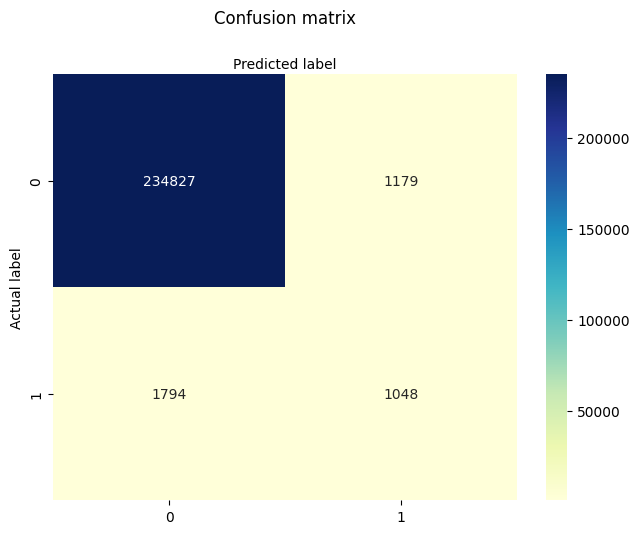

In [0]:
# import required modules
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

class_names=['Unsuccessful','Successful'] # name  of classes
fig, ax = plt.subplots()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)
# create heatmap
sns.heatmap(cnf_matrix, annot=True, cmap="YlGnBu" ,fmt='g')
ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')



In [0]:
from sklearn.metrics import classification_report
target_names = ['Unsuccess', 'Success']
print(classification_report(y_test, y_pred, target_names=target_names))

              precision    recall  f1-score   support

   Unsuccess       0.99      1.00      0.99    236006
     Success       0.47      0.37      0.41      2842

    accuracy                           0.99    238848
   macro avg       0.73      0.68      0.70    238848
weighted avg       0.99      0.99      0.99    238848



In [0]:
from sklearn.metrics import precision_score

precision = precision_score(y_test, y_pred, pos_label=1)
precision

0.47058823529411764

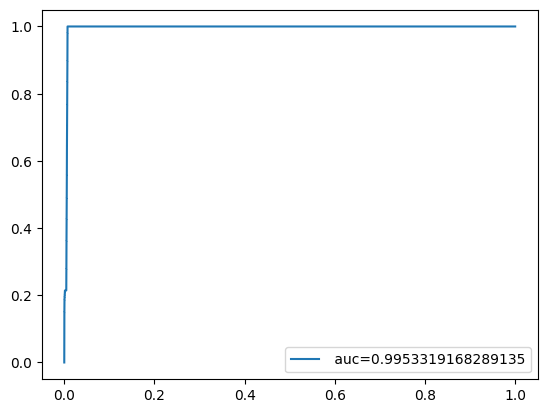

In [0]:
y_pred_proba = logreg.predict_proba(X_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)
auc = metrics.roc_auc_score(y_test, y_pred_proba)
plt.plot(fpr,tpr,label=" auc="+str(auc))
plt.legend(loc=4)
plt.show()